### BERTopic: A Modular Topic Modeling Framework

##### Lets create out old embedding, dimencity reductioin and clustering algo in BERTopic modeing

In [1]:
from hdbscan import HDBSCAN
from umap import UMAP
from sentence_transformers import SentenceTransformer
from datasets import load_dataset

In [2]:
dataset = load_dataset("maartengr/arxiv_nlp")['train']
abstracts = dataset["Abstracts"]
titels = dataset["Titles"]

In [3]:
embdd_model = SentenceTransformer("thenlper/gte-small")
embedding_abstracts = embdd_model.encode(abstracts, show_progress_bas=True)
embedding_titles = embdd_model.encode(titels, show_progress_bas=True)

In [4]:
hdbscan_model = HDBSCAN(min_cluster_size = 50, metric = "euclidean",cluster_selection_method="eom").fit(embedding_abstracts)

D:\anaconda3\envs\thellmbook\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
D:\anaconda3\envs\thellmbook\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [5]:
from umap import UMAP
umap_model = UMAP(n_components=5, min_dist=0.0, metric="cosine", random_state=42)

In [6]:
from bertopic import BERTopic

In [7]:
topic_model = BERTopic(
    embedding_model = embdd_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    verbose=True
).fit(abstracts , embedding_abstracts)

2024-12-19 10:48:45,819 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-19 10:49:19,892 - BERTopic - Dimensionality - Completed ✓
2024-12-19 10:49:19,893 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-19 10:49:33,267 - BERTopic - Cluster - Completed ✓
2024-12-19 10:49:33,276 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-19 10:49:35,466 - BERTopic - Representation - Completed ✓


In [8]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,14236,-1_of_the_and_to,"[of, the, and, to, in, we, language, for, that...",[ Large language models (LLMs) have been wide...
1,0,2318,0_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, audi...",[ End-to-end models have achieved impressive ...
2,1,2198,1_question_qa_answer_questions,"[question, qa, answer, questions, answering, a...","[ In open question answering (QA), the answer..."
3,2,979,2_translation_nmt_machine_neural,"[translation, nmt, machine, neural, bleu, engl...",[ Neural machine translation (NMT) becomes a ...
4,3,890,3_summarization_summaries_summary_abstractive,"[summarization, summaries, summary, abstractiv...",[ We present a novel divide-and-conquer metho...
...,...,...,...,...,...
149,148,55,148_propaganda_techniques_news_subtask,"[propaganda, techniques, news, subtask, detect...",[ Propaganda aims at influencing people's min...
150,149,54,149_emoji_emojis_emoticons_sentiment,"[emoji, emojis, emoticons, sentiment, social, ...","[ There is a new generation of emoticons, cal..."
151,150,53,150_gans_gan_adversarial_generation,"[gans, gan, adversarial, generation, generativ...",[ Text generation is of particular interest i...
152,151,52,151_prompt_prompts_optimization_prompting,"[prompt, prompts, optimization, prompting, llm...",[ Prompt optimization aims to find the best p...


In [9]:
topic_model.get_topic(0)

[('speech', 0.028204316374060758),
 ('asr', 0.01886175839793272),
 ('recognition', 0.01355814978852262),
 ('end', 0.009773617123226849),
 ('acoustic', 0.009410908731486914),
 ('audio', 0.006871262309331001),
 ('speaker', 0.006813567991549292),
 ('the', 0.006400823134817018),
 ('error', 0.0063179083857951065),
 ('automatic', 0.006296595101775424)]

In [11]:
topic_model.find_topics("topic_modeling")

([26, -1, 46, 83, 40],
 [0.9282431, 0.8938064, 0.88492286, 0.88083225, 0.88009316])

In [12]:
topic_model.get_topic(22)

[('emotion', 0.039590259906514616),
 ('multimodal', 0.0260308652305975),
 ('erc', 0.02113997264879719),
 ('emotions', 0.015253403776809503),
 ('fusion', 0.015149138822184193),
 ('recognition', 0.014745000429301894),
 ('modalities', 0.014218119249143473),
 ('modality', 0.012898118086538396),
 ('emotional', 0.011688007327487966),
 ('sentiment', 0.011562313562125344)]

In [14]:
topic_model.topics_[titels.index("BERTopic: Neural topic modeling with a class-based TF-IDF procedure")]

26

In [21]:
reduced_embeddings = UMAP(n_components=2, min_dist=0.0, metric="cosine", random_state=42).fit_transform(embedding_abstracts)

#### Visualization topics and doucuments

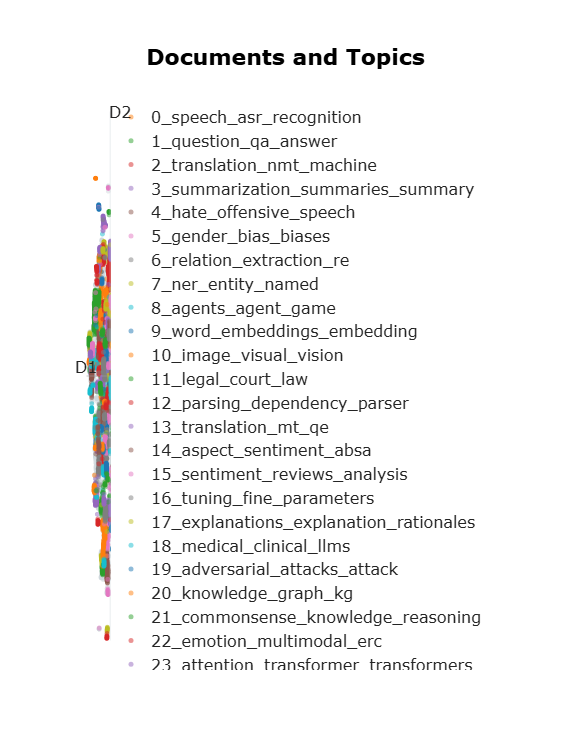

In [24]:
fig = topic_model.visualize_documents(titels,
                                      reduced_embeddings=reduced_embeddings, width=1200,  hide_annotations= True)
fig.update_layout(font=dict(size=16))

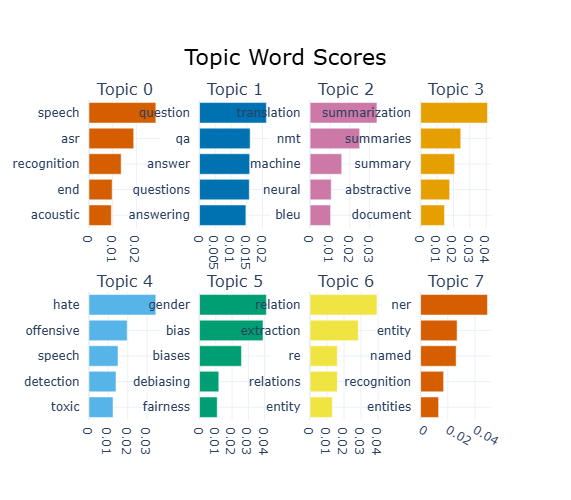

In [25]:
topic_model.visualize_barchart()

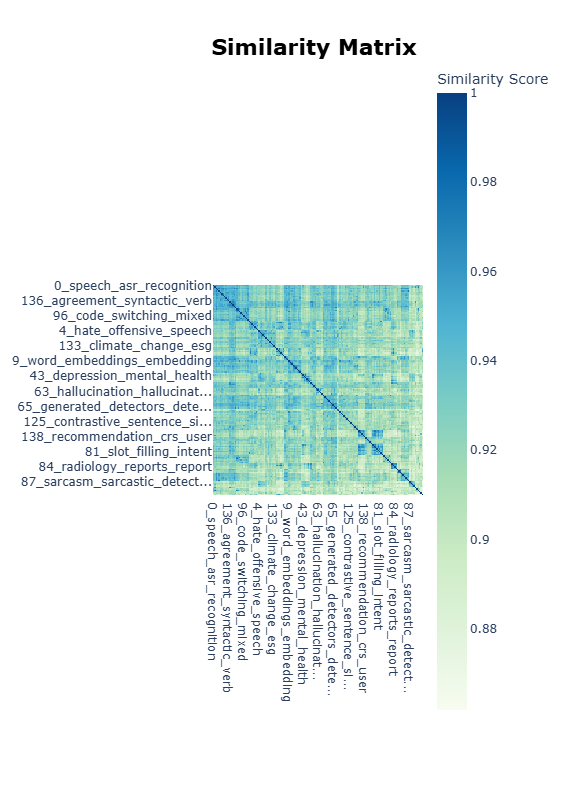

In [26]:
topic_model.visualize_heatmap(n_clusters=30)

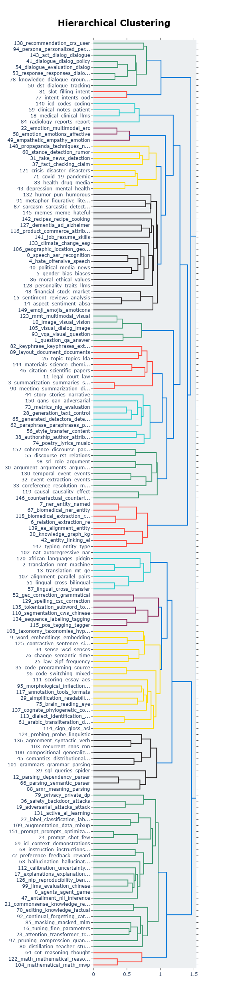

In [27]:
topic_model.visualize_hierarchy()

In [30]:
# # Visualize topics and documents
# fig = topic_model.visualize_document_datamap(titels, topics=list(range(20)), reduced_embeddings=reduced_embeddings,
#                                              width=1200, label_font_size=11, 
#                                              label_wrap_width=20,
#                                              use_medoids= True,)

### Summary

> 1. In this chapter, we explored how LLMs, both generative and representative, can be used in the domain of unsupervised learning. Despite supervised methods like classification being prevalent in recent years, unsupervised approaches such as text clustering hold immense potential due to their ability to group texts based on semantic content without prior labeling.
> 2. We covered a common pipeline for clustering textual documents that starts with converting input text into numerical representations, which we call embeddings. Then, dimensionality reduction is applied to these embeddings to simplify high-dimensional data for better clustering outcomes. Finally, a clustering algorithm on the dimensionality-reduced embeddings is applied to cluster the input text. Manually inspecting the clusters helped us understand which documents they contained and how to interpret these clusters.
> 3. To transition away from this manual inspection, we explored how BERTopic extends this text clustering pipeline with a method for automatically representing the clusters. This methodology is often referred to as topic modeling, which attempts to uncover themes within large amounts of documents. BERTopic generates these topic representations through a bag-of-words approach enhanced with c-TF-IDF, which weighs words based on their cluster relevance and frequency across all clusters.
> 4. A major benefit of BERTopic is its modular nature. In BERTopic, you can choose any model in the pipeline, which allows for additional representations of topics that create multiple perspectives of the same topic. We explored maximal marginal relevance and KeyBERTInspired as methodologies to fine-tune the topic representations generated with c-TF-IDF. Additionally, we used the same generative LLMs as in the previous chapter (Flan-T5 and GPT-3.5) to further improve the interpretability of topics by generating highly interpretable labels.